# Analysis of BT_DF_001 FLOW data
Flk1/Dlk1/PdgfRa/Runx1-Venus/Eomes-mCherry flow of RV_Eo-Deg line at D3.5, D4, D4.5, D5 with Vehicle Control (VC) or +dTAG (KD)

In [1]:
# Load Packages
suppressPackageStartupMessages({
    library(dplyr)
    library(ggplot2)
    library(data.table)
    library(stringr)
    library(purrr)
    library(BiocNeighbors)
    library(leiden)
    library(RColorBrewer)

})

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

In [2]:
# options
sample2day = c(
'B' = 'd5',
'C' = 'd4.5',
'D' = 'd4',
'E' = 'd3.5'
)

sample2rep = c(
'1' = 'rep1',
'2' = 'rep2',
'3' = 'rep3',
'4' = 'rep1',
'5' = 'rep2',
'6' = 'rep3'
)

channel2marker = c(
'Comp-450_50 405nm-A' = 'DAPI',
'Comp-530_30 488nm-A' = 'Runx1',
'Comp-561 610_20-A' = 'Eomes',
'Comp-561 780_60-A' = 'Flk1',
'Comp-605_20 405nm-A' = 'Pdgfra',
'Comp-670_14 640nm-A' = 'Dlk1'
)

# Functions
minmax = function(x){(x-min(x))/(max(x)-min(x))}


In [3]:
# Get files
files = list.files('Data')

## Define functions for Fluo data manipulations
# Log10 + 1 transformation
log10p1 = function(x){
    x = log10(x+1)
    return(x)
}

# Define a function to replace values below/above a quantile with the value of that quantile
replace_quantile = function(x, quant=0.02) {
  q_min <- quantile(x, probs = quant)
  q_max = quantile(x, probs = 1-quant)
  x[x < q_min] <- q_min
  x[x > q_max] = q_max
  return(x)
}

# Get concatenated data.table
concat = lapply(files, function(i){
    tmp = fread(sprintf('Data/%s', i)) %>%  # read each file
        .[,sample := str_remove(str_remove(i, '_Live.csv'), 'export_')] # add sample name
    return(tmp)
}) %>% rbindlist() %>% 
    .[,':='(condition = str_split(sample, '_') %>% map_chr(1), # add condition (VC vs dTAG)
            timepoint = str_replace_all(substr(str_split(sample, '_') %>% map_chr(2), 1, 1), sample2day), # Add day
            replicate = str_replace_all(substr(str_split(sample, '_') %>% map_chr(2), 2, 2), sample2rep))] %>% # Add replicate %>% 
    .[,':='(condition = factor(condition, levels = c('VC', 'dTAG')), # change factor levels for metadata
            timepoint = factor(timepoint, levels = c('d3.5', 'd4', 'd4.5', 'd5')),
            replicate = factor(replicate, levels = c('rep1','rep2','rep3')))] %>% 
    .[,condition_timepoint := paste0(condition, timepoint)] %>%
    setnames(names(channel2marker), channel2marker) %>% # Change fluorescent channel names to marker names
   # .[, as.vector(channel2marker) := lapply(.SD, log10p1), .SDcols = as.vector(channel2marker)] # %>%# log transform fluorescent values
    .[,as.vector(channel2marker) := lapply(.SD, replace_quantile, 0.0001), .SDcols = as.vector(channel2marker)] # Modify values below/above set quantile
# Should also do minmax normalisation so that the density calculation based on distance makes sense

In [213]:
# # to speed things up a bit
# concat = lapply(unique(concat$sample), function(x){
#     tmp = concat[sample==x] %>% .[sample(nrow(.), 2000)]
#     return(tmp)
# }) %>% rbindlist()

In [214]:
### TO-DO:
# x and y axis need to be scaled before calculating densities to make sure every marker is on the same scale


plot_flow = function(data = concat, x_axis='Pdgfra', y_axis='Flk1', color='Density', condition_i = NULL, timepoint_i = NULL, facet1=NULL, facet2=NULL, ncol=4){
    tmp = concat %>% copy()
    if(!is.null(condition_i)){
        tmp = tmp[condition==condition_i]
    }
    if(!is.null(timepoint_i)){
        tmp = tmp[timepoint==timepoint_i]
    }
    if(!is.null(facet1)){
        tmp = tmp %>% setnames(colnames(tmp)[which(colnames(tmp) == facet1)], 'facet1')
    }else{tmp = tmp[, facet1:=NA]}
    if(!is.null(facet2)){
        tmp = tmp %>% setnames(colnames(tmp)[which(colnames(tmp) == facet2)], 'facet2')
    }else{tmp = tmp[, facet2:=NA]}

    # Calculate densities within facets
    if(color == 'Density'){
        density_thr = 7.5
        if(!is.null(facet1)){
            tmp = lapply(unique(tmp$facet1), function(x){
                tmp_sub1 = tmp[facet1 == x]
                if(!is.null(facet2)){ # If facet1 and 2 are given
                    tmp2 = lapply(unique(tmp$facet2), function(y){
                        tmp_sub2 = tmp_sub1[facet2 == y]
                        tmp.mtx = as.matrix(tmp_sub2[, c(..x_axis, ..y_axis)])
                        tmp_sub2$Density = minmax(
                            as.numeric(
                                as.vector(
                                    lapply(
                                        rangeFindExhaustive( # Find how many neighbour within distance of threshold
                                            tmp.mtx, 
                                            threshold = density_thr, 
                                            BPPARAM = BPPARAM
                                        )$distance, length)))/nrow(tmp_sub2)) # normalise to nr of cells 
                        return(tmp_sub2)
                    }) %>% rbindlist()
                    return(tmp2)
                }else{ # if only 1 facet is givin
                    tmp.mtx = as.matrix(tmp_sub1[, c(..x_axis, ..y_axis)])
                    tmp_sub1$Density = minmax(
                        as.numeric(
                            as.vector(
                                lapply(
                                    rangeFindExhaustive( # Find how many neighbour within distance of threshold
                                        tmp.mtx, 
                                        threshold = density_thr, 
                                        BPPARAM = BPPARAM
                                    )$distance, length)))/nrow(tmp_sub1)) # normalise to nr of cells 
                    return(tmp_sub1)
                }
            }) %>% rbindlist()    
        }else{
            tmp.mtx = as.matrix(tmp[, c(..x_axis, ..y_axis)])
            tmp$Density = minmax(
                as.numeric(
                    as.vector(
                        lapply(
                            rangeFindExhaustive( # Find how many neighbour within distance of threshold
                                tmp.mtx, 
                                threshold = density_thr, 
                                BPPARAM = BPPARAM
                            )$distance, length)))/nrow(tmp))

        }
    }

    tmp.plot = tmp[,c(..x_axis, ..y_axis, ..color, 'facet1', 'facet2')] %>% 
                    setnames(c('x', 'y', 'z', 'facet1', 'facet2')) 
     
    # Order by color if numeric
    if(class(tmp.plot$z) == 'numeric'){
       tmp.plot = tmp.plot[order(z)]
    }

    p = ggplot(tmp.plot, aes(x, y, color=z)) + 
        geom_point(size = 0.2) + 
    #    geom_density_2d(color='white', alpha = 1, bins = 9) + 
        xlab(x_axis) + ylab(y_axis) + 
        theme_bw() + 
        theme(axis.text = element_blank(),
              axis.title = element_text(size=20, color='black'),
              legend.text = element_text(size=15),
              legend.title = element_text(size=20),
              strip.background = element_rect(fill='white'),
              strip.text = element_text(size=20)) 
    
    # Add color pallets
    if(class(tmp.plot$z) == 'numeric'){
        p = p + scale_color_gradientn(colors=rev(rainbow(4)), name=color)
    }
    if(class(tmp.plot$z) != 'numeric'){
        # Define the number of colors needed for your palette
        num_colors <- length(unique(tmp.plot$z))
        # Generate a color-blind friendly palette using the ColorBrewer 'Paired' palette
        if(num_colors<=8){
            color_palette <- brewer.pal(num_colors, "Set2")
        }else{
            color_palette <- c(brewer.pal(8, "Set2"), c(brewer.pal(num_colors-8, "Paired")))
        }
        # Add colors to plot
        p = p + scale_color_manual(values = color_palette, name=color)
    }
    
    if(!is.null(facet1) & !is.null(facet2)){
        p = p + facet_wrap(~facet1 + facet2, ncol=ncol)
    }else if(!is.null(facet1) & is.null(facet2)){
        p = p + facet_wrap(~facet1, ncol=ncol)
    }
    #return(tmp.plot)
    return(p)
}

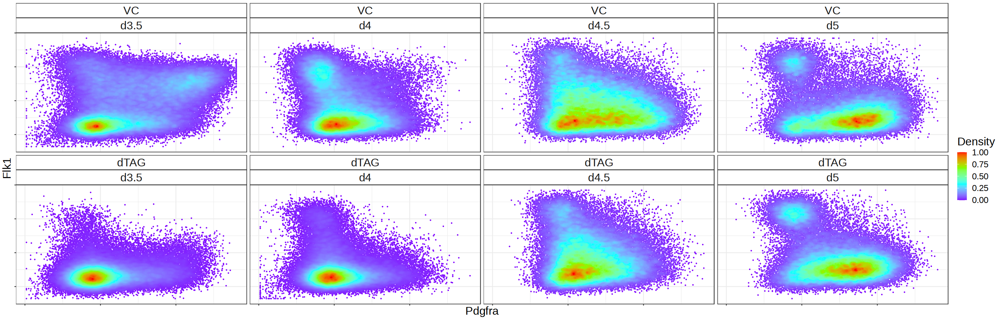

In [6]:
options(repr.plot.width=25, repr.plot.height=8)
plot_flow(x_axis='Pdgfra', y_axis='Flk1', color='Density', condition_i = NULL, timepoint_i = NULL, facet1='condition', facet2='timepoint')

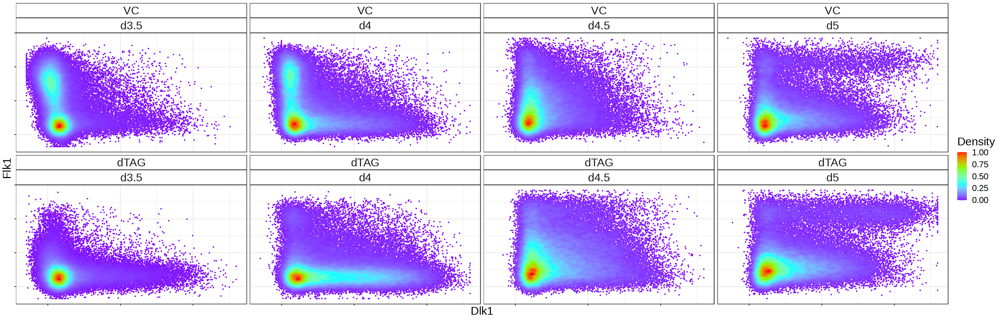

In [7]:
plot_flow(x_axis='Dlk1', y_axis='Flk1', color='Density', condition_i = NULL, timepoint_i = NULL, facet1='condition', facet2='timepoint')

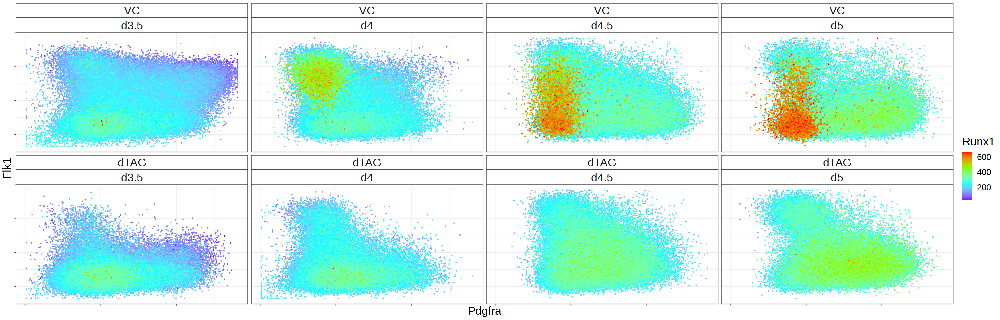

In [8]:
options(repr.plot.width=25, repr.plot.height=8)
plot_flow(x_axis='Pdgfra', y_axis='Flk1', color='Runx1', condition_i = NULL, timepoint_i = NULL, facet1='condition', facet2='timepoint')

In [9]:
density_plot = function(marker, facet1=NULL, facet2=NULL, ncol){
    tmp = concat %>% copy()
    p = ggplot(tmp, aes_string(x=marker, fill='condition_timepoint')) +
        geom_density(alpha=0.2) + 
        xlab(toString(marker)) + ylab('Density') + 
        theme_bw() + 
        theme(axis.text.y = element_blank(),
              axis.text.x = element_text(size=15, color='black'),
              axis.title = element_text(size=20, color='black'),
              legend.text = element_text(size=15),
              legend.title = element_text(size=20),
              strip.background = element_rect(fill='white'),
              strip.text = element_text(size=20)) 
    
    if(!is.null(facet1)){
    tmp = tmp %>% setnames(colnames(tmp)[which(colnames(tmp) == facet1)], 'facet1')
    }else{tmp = tmp[, facet1:=NA]}
    if(!is.null(facet2)){
        tmp = tmp %>% setnames(colnames(tmp)[which(colnames(tmp) == facet2)], 'facet2')
    }else{tmp = tmp[, facet2:=NA]}
    
    if(!is.null(facet1) & !is.null(facet2)){
        p = p + facet_wrap(~facet1 + facet2, ncol=ncol)
    }else if(!is.null(facet1) & is.null(facet2)){
        p = p + facet_wrap(~facet1, ncol=ncol)
    }
    return(p)
    
}

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


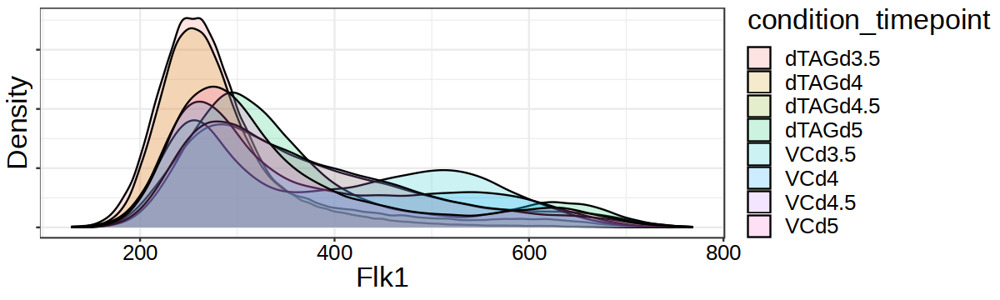

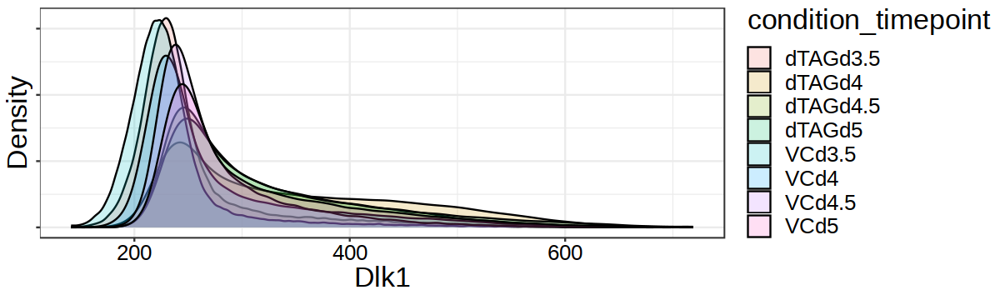

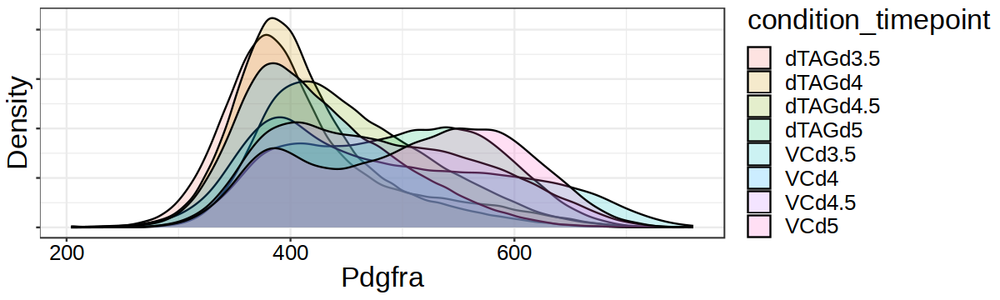

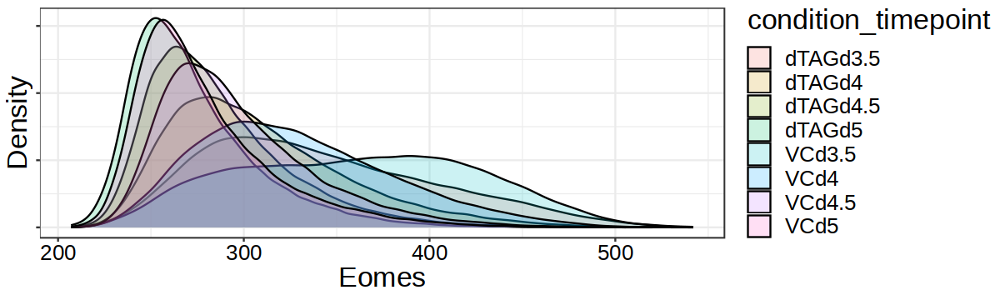

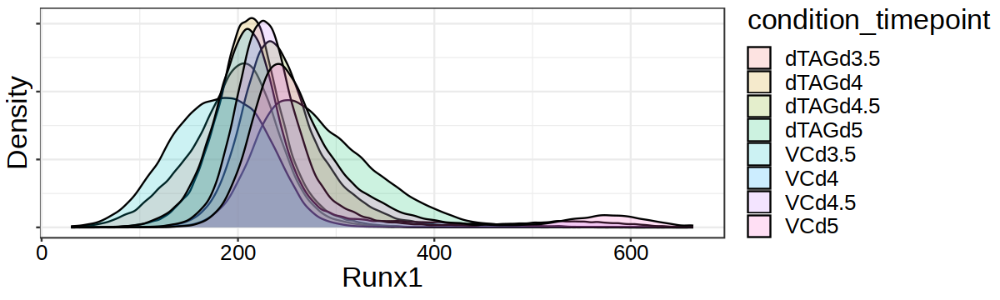

In [10]:
options(repr.plot.width=10, repr.plot.height=3)
density_plot('Flk1')
density_plot('Dlk1')
density_plot('Pdgfra')
density_plot('Eomes')
density_plot('Runx1')

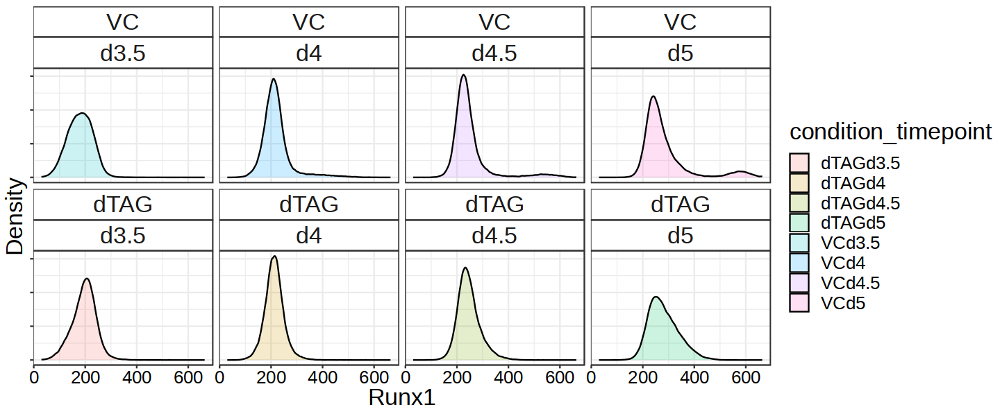

In [21]:
options(repr.plot.width=12, repr.plot.height=5)

density_plot('Runx1', facet1 = 'condition', facet2 = 'timepoint', ncol=4)

In [4]:
# Set gates based density plots --> add binary column for every marker
set_gate = function(marker, value){
    concat = concat[, paste0(marker, '_binary') := ifelse(concat[, eval(parse(text = marker))]>value, 1, 0)]
}

set_gate('Flk1', 400)
set_gate('Dlk1', 300)
set_gate('Pdgfra', 480)
set_gate('Runx1', 450)
set_gate('Eomes', 350)

# function to calculate proportion of cells in population per replicate
proportions = concat %>% copy() %>%
    .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% # total numbers per replicate
    .[,':='( # For each Marker we filter the cells that are positive, count how many they are per replicate, & devide by total cells in that replicate
            Flk1prop = (concat[Flk1_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Dlk1prop = (concat[Dlk1_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Pdgfraprop = (concat[Pdgfra_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Runx1prop = (concat[Runx1_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Eomesprop = (concat[Eomes_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100
    )]


# function to make bar graph + significance statistics
plot_bargraph = function(marker, data = proportions){
    tmp = data %>% copy() %>%
        .[, mean := lapply(.SD, mean), .SDcols = paste0(marker, 'prop'), by=c('condition', 'timepoint')] %>%
        .[, sdev := lapply(.SD, sd), .SDcols = paste0(marker, 'prop'), by=c('condition', 'timepoint')] %>%
        unique(by=c('condition', 'timepoint'))
    
    stats = lapply(unique(data$timepoint), function(x){
            tmp = data %>% copy() %>% 
                    .[order(replicate)] %>%
                    .[timepoint == x]
            name = paste0(marker, 'prop')
            if(nrow(tmp)==6){
                tmp2 = data.table(timepoint = x,
                                 p_value = t.test(tmp[condition=='VC'][, name, with = FALSE][[1]],
                                                  tmp[condition=='dTAG'][, name, with = FALSE][[1]],
                                                  paired=TRUE)$p.value)
                return(tmp2)
            }
        }) %>% rbindlist()
    
    p = ggplot(tmp, aes(x=timepoint, y=mean, fill=condition)) + 
        geom_bar(stat="identity", color="black", 
               position=position_dodge()) +
        geom_errorbar(aes(ymin=mean-sdev, ymax=mean+sdev), width=.2,
                     position=position_dodge(.9)) +
        geom_label(data = stats[, condition:='VC'], aes(x=timepoint, y=-max(tmp$mean)/7, label = round(p_value, 5)), fill='white', size=5) + 
        geom_hline(yintercept=0) + 
        scale_fill_manual(values = c('VC' = 'grey50', 'dTAG' = 'red')) + 
        ylim(-max(tmp$mean)/6, max(tmp$mean+tmp$sdev)) + 
        ylab('Proportion (%)') + 
        ggtitle(marker) + 
        theme_bw() + 
        theme(axis.text = element_text(size=15, color='black'),
              axis.title = element_text(size=20, color='black'),
              legend.text = element_text(size=15),
              legend.title = element_text(size=20),
              plot.title = element_text(size=25))
    
    return(p)
}

In [5]:
p = lapply(c('Flk1', 
        'Dlk1', 
        'Pdgfra',
        'Runx1',
        'Eomes'), 
       plot_bargraph)

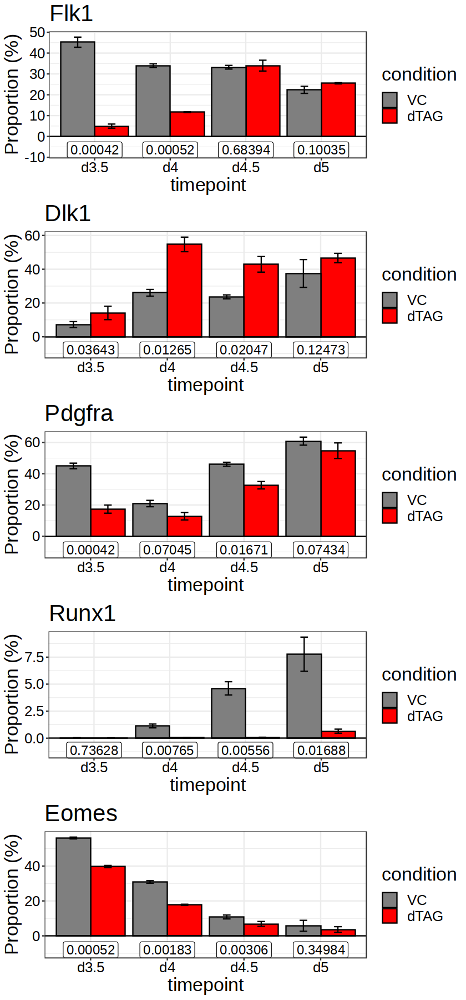

In [6]:
options(repr.plot.width=7, repr.plot.height=15)
ggpubr::ggarrange(plotlist=p, ncol=1)

In [7]:
multigates = function(
        Flk1_i=NULL,
        Dlk1_i=NULL,
        Pdgfra_i=NULL,
        Runx1_i=NULL,
        Eomes_i=NULL){
    tmp = concat %>% copy() %>%
        .[, .N, by=c('condition', 'timepoint', 'replicate')] # total numbers per replicate
    tmp2 = concat %>% copy()
    if(!is.null(Flk1_i)){
         tmp2 = tmp2[Flk1_binary==Flk1_i]
    }
    if(!is.null(Dlk1_i)){
     tmp2 = tmp2[Dlk1_binary==Dlk1_i]
    }
    if(!is.null(Pdgfra_i)){
     tmp2 = tmp2[Pdgfra_binary==Pdgfra_i]
    }
    if(!is.null(Runx1_i)){
     tmp2 = tmp2[Runx1_binary==Runx1_i]
    }
    if(!is.null(Eomes_i)){
     tmp2 = tmp2[Eomes_binary==Eomes_i]
    }
    tmp2 = tmp2[, .N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'N_sub')

    tmp = merge(tmp, tmp2, by = c('condition', 'timepoint', 'replicate')) %>%
        .[,prop := N_sub/N*100]
    p = plot_bargraph(marker = '', data = tmp)
    return(p)
}

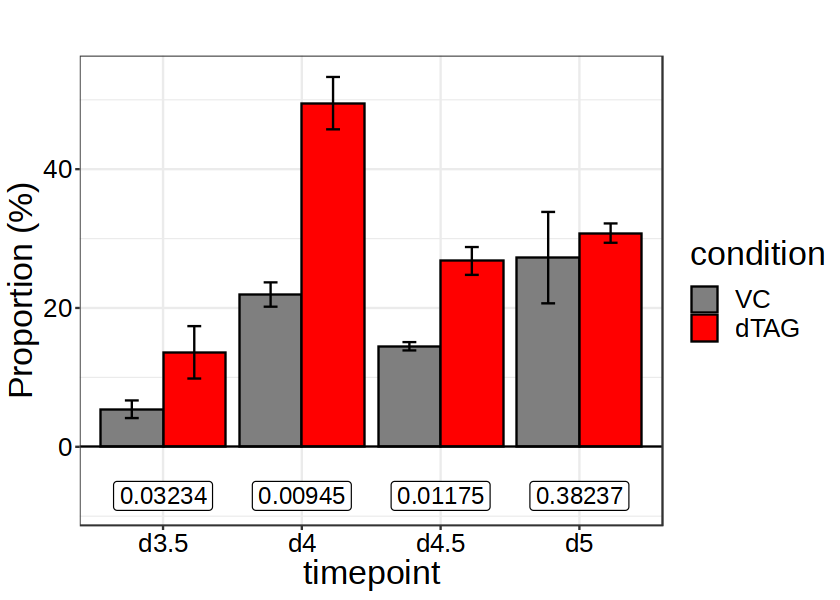

In [9]:
options(repr.plot.width=7, repr.plot.height=5)
multigates(Flk1_i=0,
            Dlk1_i=1,
            Pdgfra_i=NULL,
            Runx1_i=NULL,
            Eomes_i=NULL)

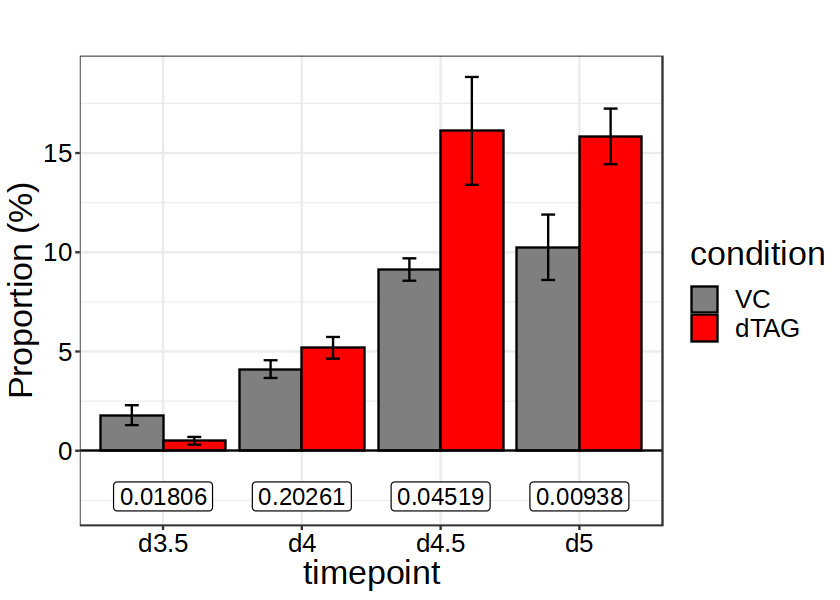

In [8]:
options(repr.plot.width=7, repr.plot.height=5)
multigates(Flk1_i=1,
            Dlk1_i=1,
            Pdgfra_i=NULL,
            Runx1_i=NULL,
            Eomes_i=NULL)

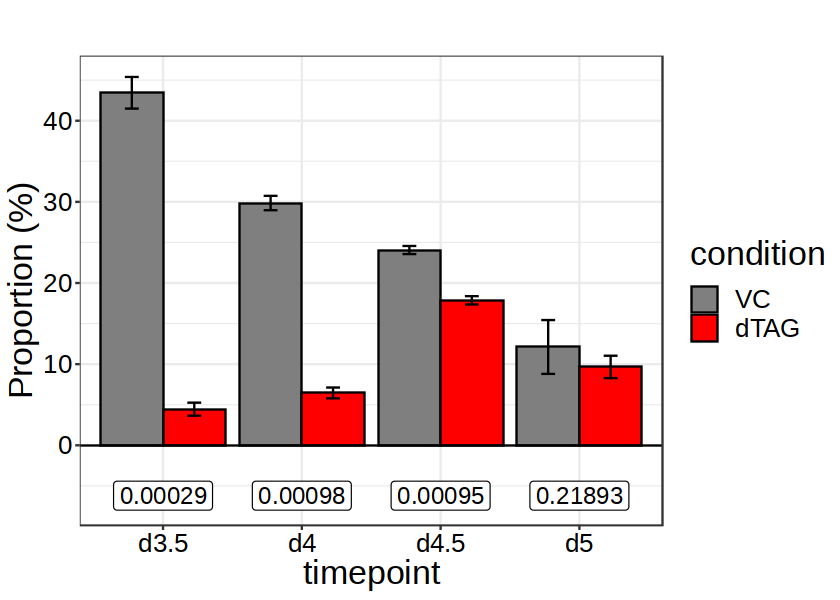

In [10]:
options(repr.plot.width=7, repr.plot.height=5)
multigates(Flk1_i=1,
            Dlk1_i=0,
            Pdgfra_i=NULL,
            Runx1_i=NULL,
            Eomes_i=NULL)

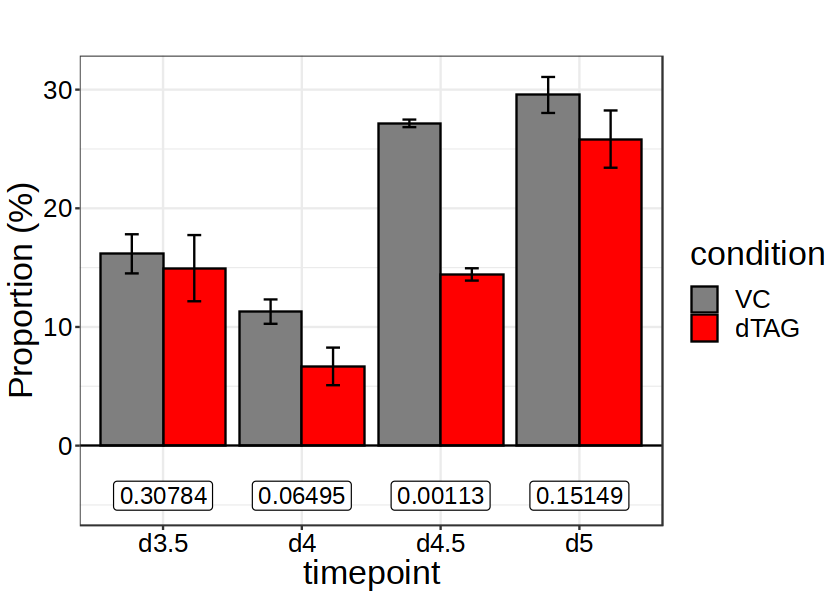

In [20]:
options(repr.plot.width=7, repr.plot.height=5)
multigates(Flk1_i=0,
            Dlk1_i=0,
            Pdgfra_i=1,
            Runx1_i=NULL,
            Eomes_i=NULL)

#### Clustering

In [225]:
suppressPackageStartupMessages({
    library(Seurat)
    library(future)
})

plan("multisession", workers = 12) # Seurat parallel processing

In [226]:
concat.mtx = as.matrix(concat[, as.vector(channel2marker)[-1], with=FALSE]) # Make matrix of markers (w/o dapi)
rownames(concat.mtx) = concat[,ID:=.I] %>% .$I

In [227]:
# Make seurat object
concat.seurat = CreateSeuratObject(counts = t(concat.mtx))

# We need to make an emtpy PCA so we can replace it with the original data
concat.seurat = suppressWarnings(FindVariableFeatures(concat.seurat, verbose = F))
concat.seurat = suppressWarnings(ScaleData(concat.seurat, verbose=F))
concat.seurat <- suppressWarnings(RunPCA(concat.seurat, verbose = F))

# replace PCA embeddings with the scaled original data 
# Scaling might be important because otherwise distances get calculated on different scales for each marker
concat.seurat@reductions$pca@cell.embeddings = concat.mtx

In [ ]:
# Find Neighbors
concat.seurat <- FindNeighbors(concat.seurat, dims = 1:5)

In [168]:
# Get clusters
concat.seurat <- FindClusters(concat.seurat, resolution = 0.2)
concat$cluster = concat.seurat$seurat_clusters

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 632062
Number of edges: 16200547

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9219
Number of communities: 7
Elapsed time: 427 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


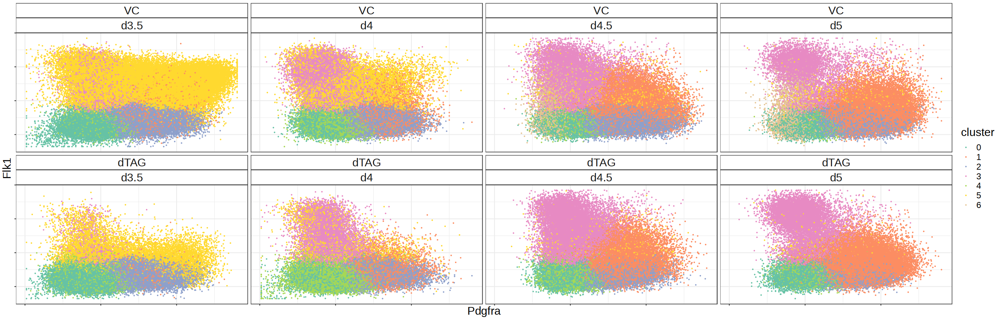

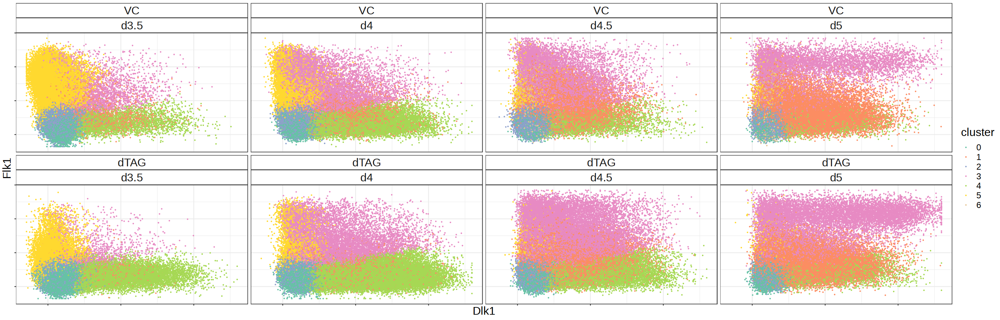

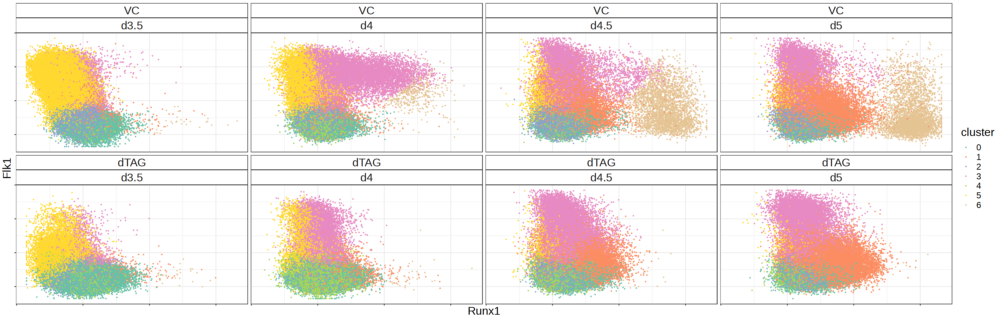

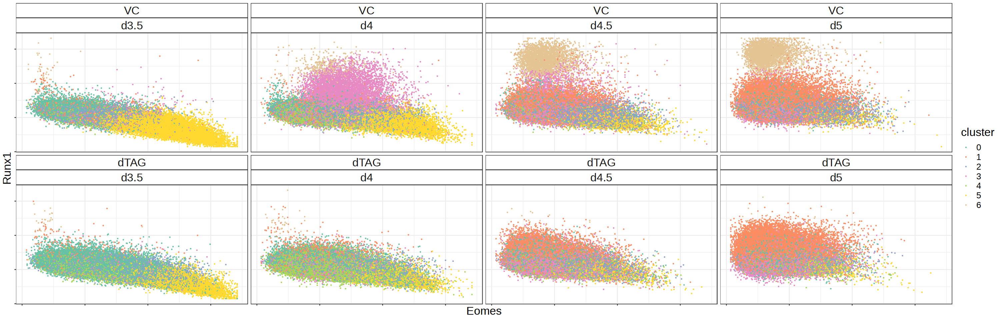

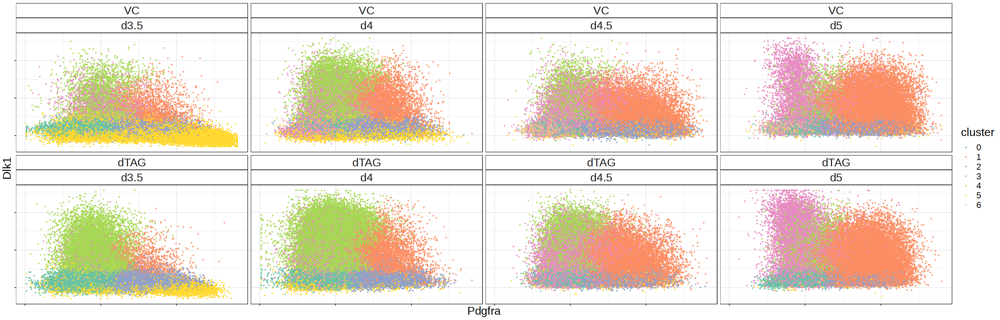

In [169]:
options(repr.plot.width=25, repr.plot.height=8)
plot_flow(x_axis='Pdgfra', y_axis='Flk1', color='cluster', condition_i = NULL, timepoint_i = NULL, facet1 = 'condition', facet2 = 'timepoint')
plot_flow(x_axis='Dlk1', y_axis='Flk1', color='cluster', condition_i = NULL, timepoint_i = NULL, facet1 = 'condition', facet2 = 'timepoint')
plot_flow(x_axis='Runx1', y_axis='Flk1', color='cluster', condition_i = NULL, timepoint_i = NULL, facet1 = 'condition', facet2 = 'timepoint')
plot_flow(x_axis='Eomes', y_axis='Runx1', color='cluster', condition_i = NULL, timepoint_i = NULL, facet1 = 'condition', facet2 = 'timepoint')
plot_flow(x_axis='Pdgfra', y_axis='Dlk1', color='cluster', condition_i = NULL, timepoint_i = NULL, facet1 = 'condition', facet2 = 'timepoint')

In [170]:
cluster_marker_plot = function(marker){
    p = ggplot(concat, aes_string('cluster', marker, fill='cluster')) +
        geom_violin() + 
        geom_boxplot(width=0.2, fill='white', outlier.shape=NA) + 
        scale_fill_manual(values = brewer.pal(8, "Set2"), name='cluster') + 
        theme_bw() + 
        theme(axis.text.y = element_blank(),
              axis.text.x = element_text(size=15, color='black'),
              axis.title = element_text(size=20, color='black'),
              legend.text = element_text(size=15),
              legend.title = element_text(size=20),
              strip.background = element_rect(fill='white'),
              strip.text = element_text(size=20)) 
    return(p)
}

In [171]:
p = lapply(c('Flk1', 
        'Dlk1', 
        'Pdgfra',
        'Runx1',
        'Eomes'), 
       cluster_marker_plot)

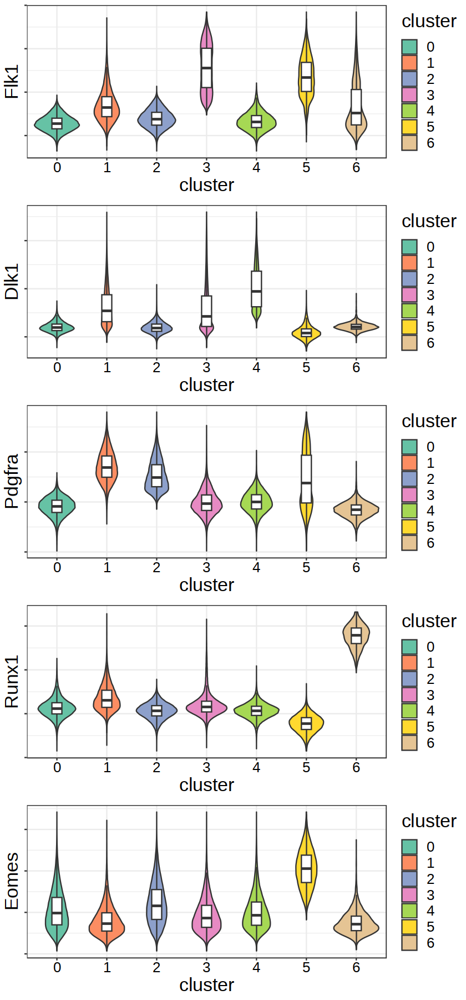

In [172]:
options(repr.plot.width=7, repr.plot.height=15)
ggpubr::ggarrange(plotlist=p, ncol=1)

In [307]:
# function to calculate proportion of cells in population per replicate
proportions = concat %>% copy() %>%
    .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% # total numbers per replicate
    .[,':='( # For each Marker we filter the cells that are positive, count how many they are per replicate, & devide by total cells in that replicate
            Flk1prop = (concat[Flk1_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Dlk1prop = (concat[Dlk1_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Pdgfraprop = (concat[Pdgfra_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Runx1prop = (concat[Runx1_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100,
            Eomesprop = (concat[Eomes_binary==1] %>% copy() %>%
                .[, .N, by=c('condition', 'timepoint', 'replicate')] %>% .$N)/N*100
    )]

In [308]:
# For some reason I can't loop this !?!
x = 0
proportions = concat %>% copy() %>% 
        .[cluster==x] %>%
        .[,.N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'Ncluster') %>% 
        merge(., proportions, by=c('condition', 'timepoint', 'replicate')) %>%
        .[,Pclust:=Ncluster/N*100] %>% 
        .[,Ncluster:=NULL] %>%
        setnames('Pclust', paste0('clust', x, 'prop'))
x = 1
proportions = concat %>% copy() %>% 
        .[cluster==x] %>%
        .[,.N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'Ncluster') %>% 
        merge(., proportions, by=c('condition', 'timepoint', 'replicate')) %>%
        .[,Pclust:=Ncluster/N*100] %>% 
        .[,Ncluster:=NULL] %>%
        setnames('Pclust', paste0('clust', x, 'prop'))
x = 2
proportions = concat %>% copy() %>% 
        .[cluster==x] %>%
        .[,.N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'Ncluster') %>% 
        merge(., proportions, by=c('condition', 'timepoint', 'replicate')) %>%
        .[,Pclust:=Ncluster/N*100] %>% 
        .[,Ncluster:=NULL] %>%
        setnames('Pclust', paste0('clust', x, 'prop'))
x = 3
proportions = concat %>% copy() %>% 
        .[cluster==x] %>%
        .[,.N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'Ncluster') %>% 
        merge(., proportions, by=c('condition', 'timepoint', 'replicate')) %>%
        .[,Pclust:=Ncluster/N*100] %>% 
        .[,Ncluster:=NULL] %>%
        setnames('Pclust', paste0('clust', x, 'prop'))
x = 4
proportions = concat %>% copy() %>% 
        .[cluster==x] %>%
        .[,.N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'Ncluster') %>% 
        merge(., proportions, by=c('condition', 'timepoint', 'replicate')) %>%
        .[,Pclust:=Ncluster/N*100] %>% 
        .[,Ncluster:=NULL] %>%
        setnames('Pclust', paste0('clust', x, 'prop'))
x = 5
proportions = concat %>% copy() %>% 
        .[cluster==x] %>%
        .[,.N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'Ncluster') %>% 
        merge(., proportions, by=c('condition', 'timepoint', 'replicate')) %>%
        .[,Pclust:=Ncluster/N*100] %>% 
        .[,Ncluster:=NULL] %>%
        setnames('Pclust', paste0('clust', x, 'prop'))
x = 6
proportions = concat %>% copy() %>% 
        .[cluster==x] %>%
        .[,.N, by=c('condition', 'timepoint', 'replicate')] %>%
        setnames('N', 'Ncluster') %>% 
        merge(., proportions, by=c('condition', 'timepoint', 'replicate')) %>%
        .[,Pclust:=Ncluster/N*100] %>% 
        .[,Ncluster:=NULL] %>%
        setnames('Pclust', paste0('clust', x, 'prop'))

In [310]:
p = lapply(paste0('clust', 0:6), 
       plot_bargraph)

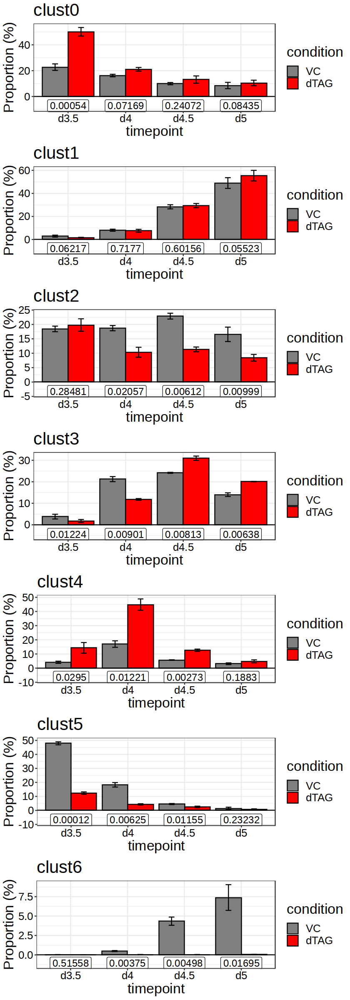

In [312]:
options(repr.plot.width=7, repr.plot.height=20)
ggpubr::ggarrange(plotlist=p, ncol=1)